# Data Analysis

In [1]:
import pickle

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

### Daten laden

In [2]:
# Daten laden und aufteilen in Features und Labels
with open('../data/train.pkl', 'rb') as f:
    data_train = pickle.load(f)
X_data = data_train["images"]
y_data = data_train["labels"]

In [3]:
print(type(X_data), X_data.shape)
print(type(y_data), y_data.shape)

<class 'numpy.ndarray'> (50000, 32, 32, 3)
<class 'numpy.ndarray'> (50000,)


Die Trainings-Daten bestehen aus 50'000 Bildern.
Jedes Bild besteht aus 32x32 Pixeln mit den 3 Kanälen für die Farben (RGB).
Oft müssen wir unsere Daten aber in eine 2D-Matrix transformieren, wobei jede Zeile ein Datenpunkt (hier Bild ist) und jede Spalte ein Feature (hier Pixel-Farbkanal-Intensität).
Dies können wir mit der `reshape` Funktion von `numpy` erreichen.
Wir ordnen die Pixel-Farbkanal-Intensität nicht mehr 3-Dimensional in Pixel und Farbkanal an, sondern 1-Dimensional in einen einzelnen Vektor.

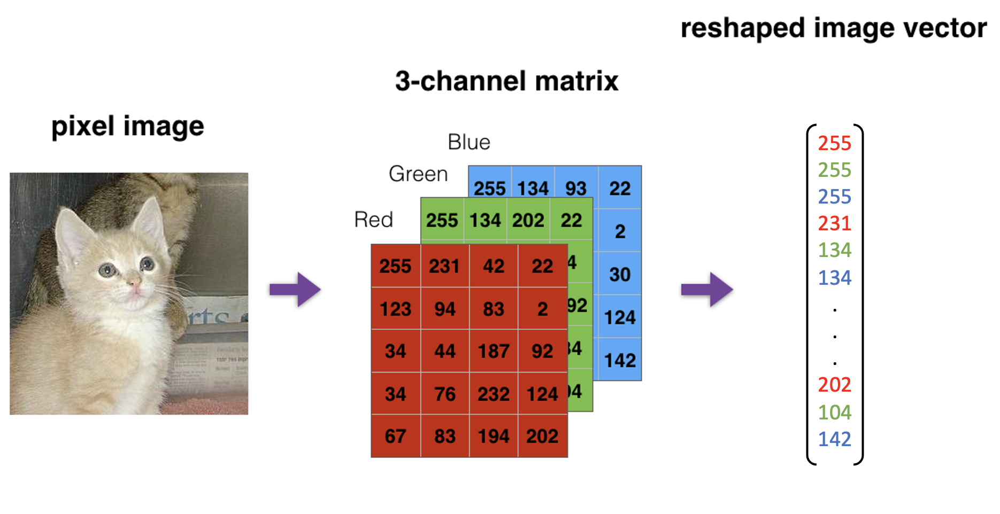

In [4]:
pd.DataFrame(X_data.reshape(-1, 32 * 32 * 3)).describe()

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
count,50000.000000,50000.00000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,130.710740,136.05614,132.553800,130.14036,135.442380,131.853580,131.050440,136.24616,132.581440,131.568860,...,113.877800,126.778360,125.697080,113.830580,126.564960,125.617420,113.906240,126.639080,125.850300,114.381860
std,73.412873,72.90798,80.449751,72.44259,71.901316,79.598048,72.240546,71.67471,79.434675,72.016555,...,64.738943,63.954763,61.591233,64.894603,64.178427,61.831646,65.212671,64.926283,62.649286,66.077526
min,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,71.000000,77.00000,61.000000,71.00000,78.000000,61.000000,73.000000,79.00000,62.000000,73.000000,...,64.000000,79.000000,81.000000,64.000000,79.000000,81.000000,64.000000,78.000000,80.000000,63.000000
50%,128.000000,135.00000,127.000000,127.00000,135.000000,127.000000,129.000000,136.00000,128.000000,130.000000,...,106.000000,124.000000,123.000000,106.000000,124.000000,123.000000,106.000000,124.000000,123.000000,106.000000
75%,189.000000,195.00000,207.000000,188.00000,193.000000,206.000000,188.000000,194.00000,206.000000,188.000000,...,157.000000,172.000000,167.000000,157.000000,172.000000,167.000000,157.000000,172.000000,168.000000,158.000000
max,255.000000,255.00000,255.000000,255.00000,255.000000,255.000000,255.000000,255.00000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


### Anzeigen einer Auswahl von Bildern

Wir wählen zufällig 100 Bilder aus und zeigen sie mit den dazugehörenden Labels an.

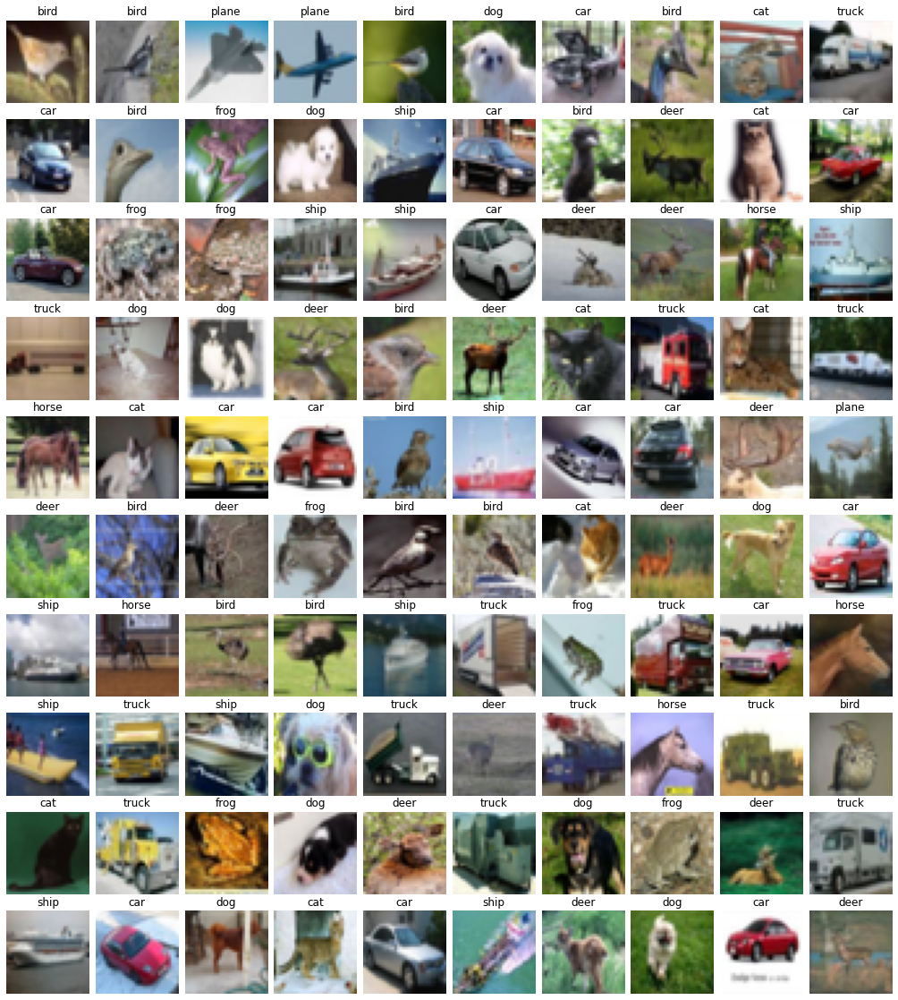

In [5]:
fig = plt.figure(figsize=(20., 20.))

grid = ImageGrid(fig, 111,
    nrows_ncols=(10, 10),
    axes_pad=(0.1, 0.25),
)

idx = np.arange(y_data.size)
np.random.shuffle(idx)

for ax, im, label in zip(grid, X_data[idx], y_data[idx]):
    ax.set_title(label)
    ax.axis('off')
    ax.imshow(im)

plt.show()

Um die einzelnen Klassen noch etwas besser zu verstehen, wählen wir pro Klasse 100 Bilder aus um sie anzuzeigen.

/var/folders/q6/w0x51kqj1g11s30hfh0x8ycc0000gn/T/ipykernel_37599/36899698.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


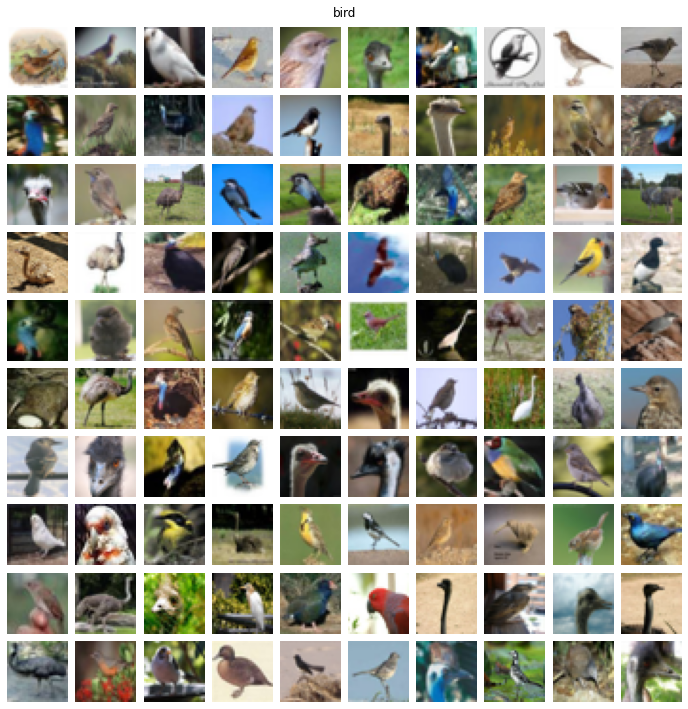

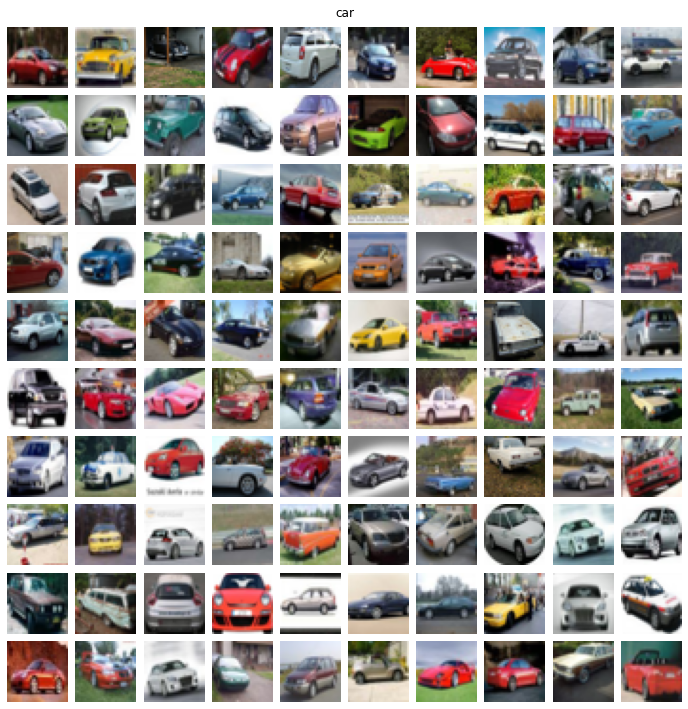

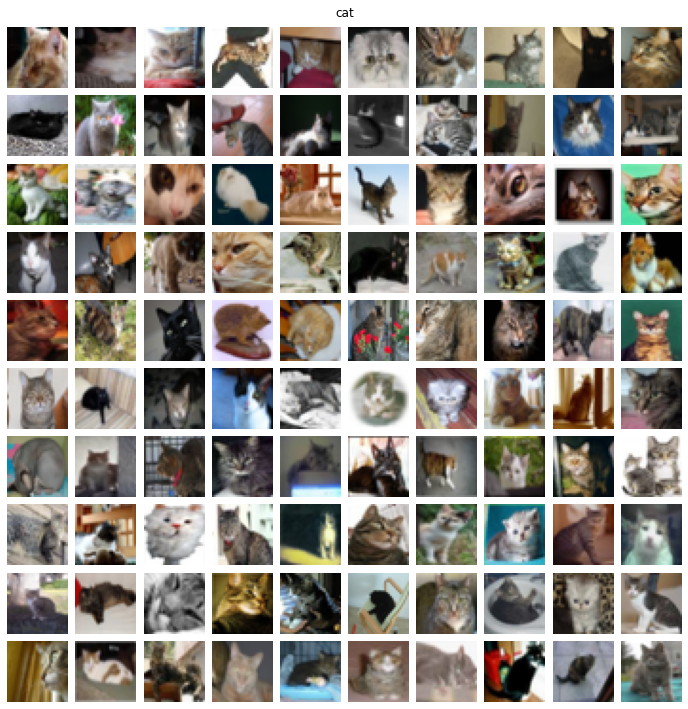

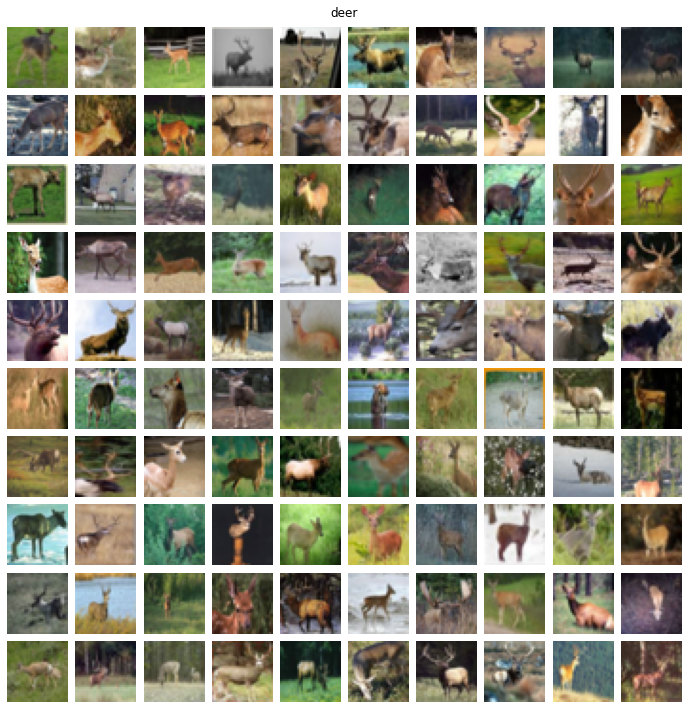

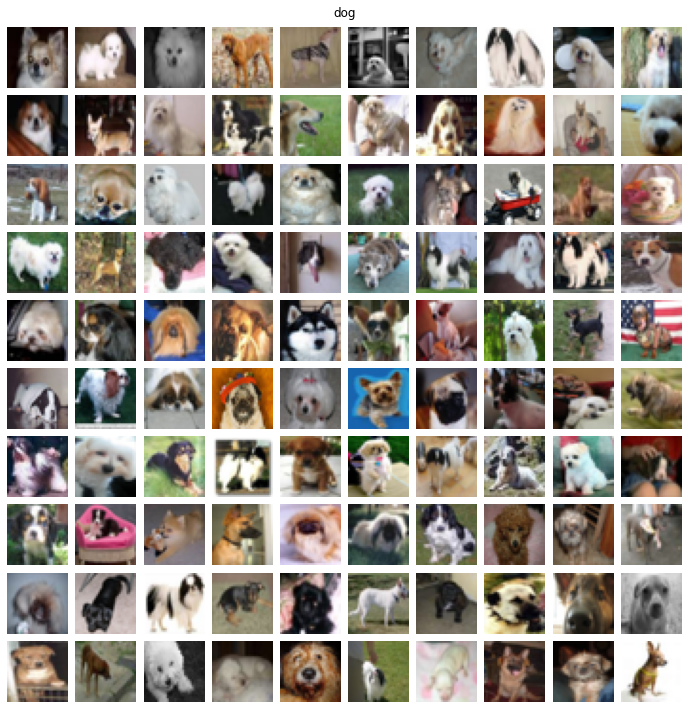

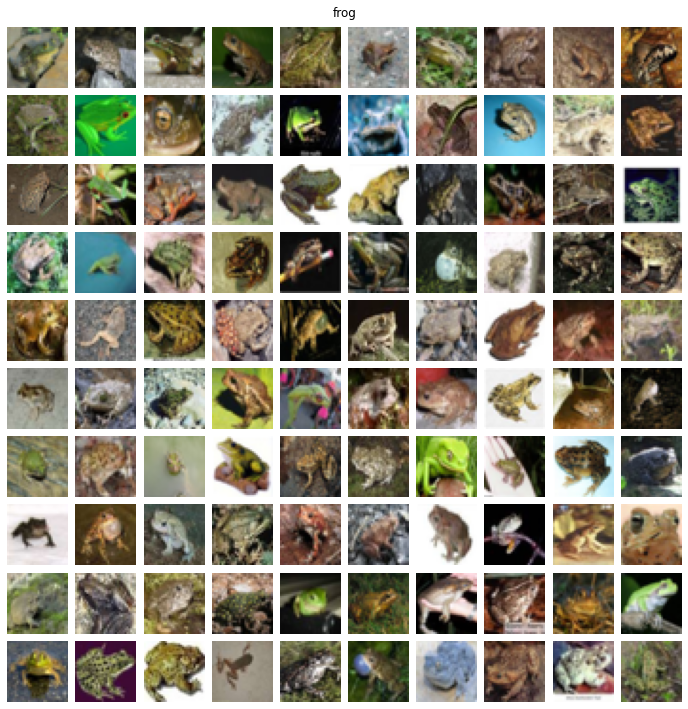

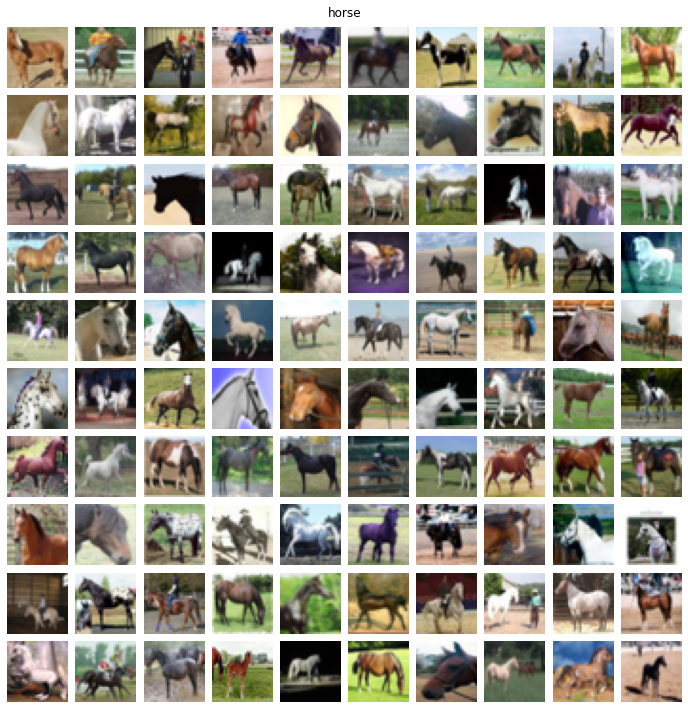

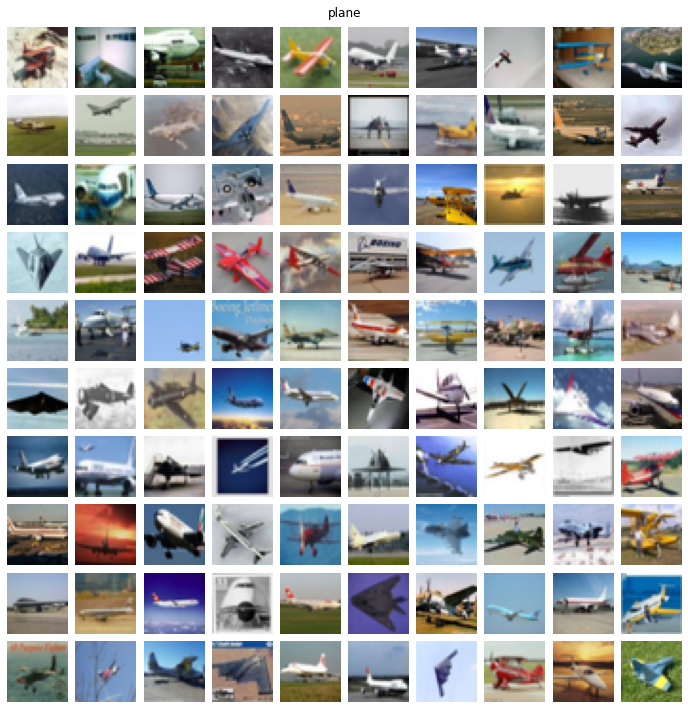

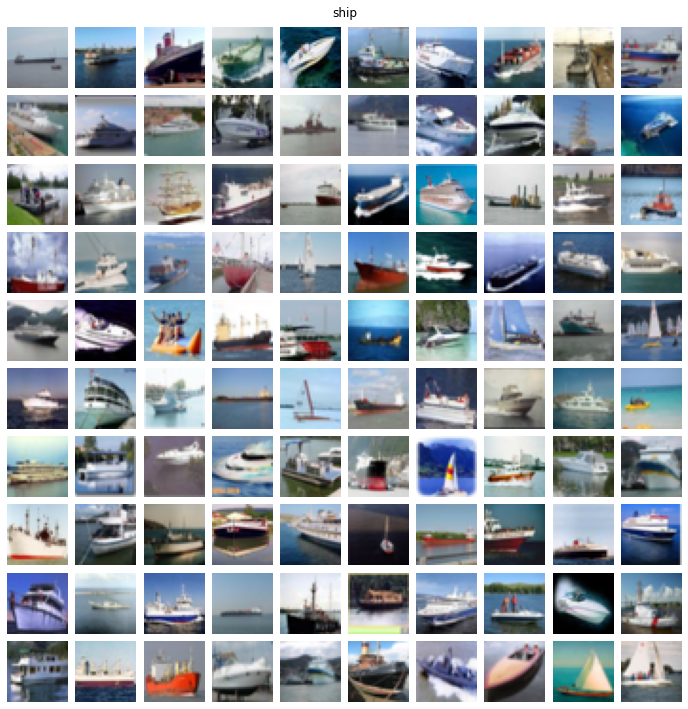

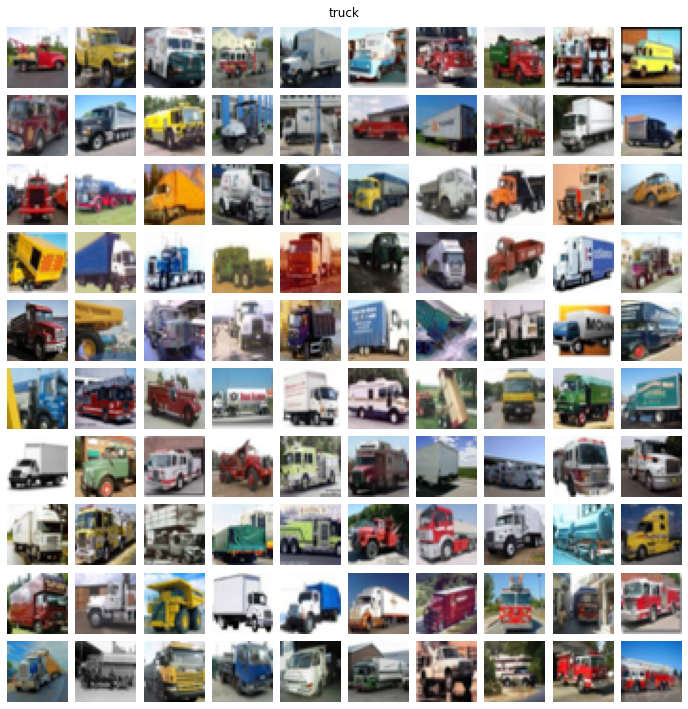

In [6]:
for category in np.unique(y_data):
    fig = plt.figure(figsize=(10., 10.))

    grid = ImageGrid(fig, 111,
        nrows_ncols=(10, 10),
        axes_pad=(0.1, 0.1),
    )
    fig.suptitle(category)

    X_data_cat = X_data[y_data == category, :, :, :]
    y_data_cat = y_data[y_data == category]

    idx = np.arange(y_data_cat.size)
    np.random.shuffle(idx)

    for ax, im, label in zip(grid, X_data_cat[idx], y_data_cat[idx]):
        ax.axis('off')
        ax.imshow(im)

    plt.tight_layout()
    plt.show()

Ein paar Sachen, welche auf den ersten Blick auffallen:
* Die `birds` sind eher am Boden, und nicht in der Luft abgebildet
* Die `planes` hingegen meisten in der Luft
* Bei den `trucks` sind viele Feuerwehrautos vertreten
* Bei den `cars` sind einige Auto auf weissen Hintergrund dargestellt

### Balancierung der Klassen

Die Balancierung der Klassen ist ein wichtiger Aspekt für die Klassifikation. Mit countplot können wir die Verteilung der Klassen anzeigen und verifizieren, dass sie wie in der Beschreibung von cifar10 definiert, ausgeglichen sind.

<AxesSubplot:ylabel='count'>

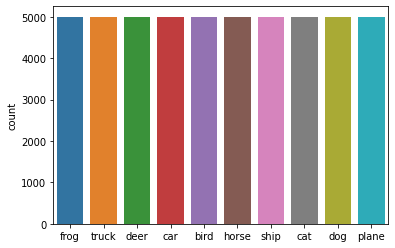

In [7]:
sns.countplot(x=y_data)
plt.show()

### Farb Analyse der Klassen

Wir schauen uns nun die Farbkanäle der einzelnen Klassen etwas genauer an. Dazu berechnen wir die Durchschnittwerte der einzelnen Farbkanäle und auch aller Kanäle zusammen für jede Klasse. Diese plotten wir in einem Barplot.

In [8]:
color_stats = []
for cat in set(y_data):
    color_stats.append({
        'cat': cat,
        'color': 'all',
        'mean': X_data[y_data == cat,:,:,:].mean(),
        'min_mean': X_data[y_data == cat,:,:,:].min(axis=(1,2)).mean(),
        'max_mean': X_data[y_data == cat,:,:,:].max(axis=(1,2)).mean(),
    }) 
    for i, color in enumerate(['red','green','blue']):
        color_stats.append({
            'cat': cat,
            'color': color,
            'mean': X_data[y_data == cat,:,:,i].mean(),
            'min_mean': X_data[y_data == cat,:,:,i].min(axis=(1,2)).mean(),
            'max_mean': X_data[y_data == cat,:,:,i].max(axis=(1,2)).mean(),
        })
color_stats = pd.DataFrame(color_stats)

In [9]:
color_stats.head()

,cat,color,mean,min_mean,max_mean
0,frog,all,106.561934,15.5660,216.994467
1,frog,red,119.864550,19.5836,228.873600
2,frog,green,111.790387,16.9114,220.362600
3,frog,blue,88.030863,10.2030,201.747200
4,car,all,116.697537,8.2596,242.709867


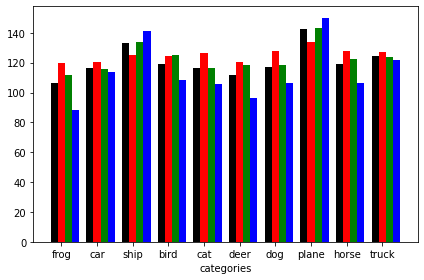

In [10]:
labels = color_stats.cat.unique()
x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots()
ax.bar(x - width,   color_stats[(color_stats.color == 'all')]['mean'], width, color='black')
ax.bar(x,           color_stats[(color_stats.color == 'red')]['mean'], width, color='red')
ax.bar(x + width,   color_stats[(color_stats.color == 'green')]['mean'], width, color='green')
ax.bar(x + width*2, color_stats[(color_stats.color == 'blue')]['mean'], width, color='blue')

ax.set_xlabel('categories')
ax.set_xticks(x)
ax.set_xticklabels(labels)

fig.tight_layout()

plt.show()

Das einzige was hier speziell auffällt, ist das wie erwartet bei den Flugzeugen und Schiffen der Blau-Kanal deutlich höher ist als in den anderen Klassen.

## Nächste Schritte

Als nächstes werden wir eine `Baseline` erstellen mittels `Logistic Regression`.
Dazu müssen wir die Daten mittels `reshape` in einen 2-Dimensionalen Vektor transformieren.
Und anschliessend in eine `Logistic Regression` geben.